In [1]:
!pip install ipympl --user

^C


In [13]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from IPython import display
%matplotlib widget

## **1. Minimization of a convex non-differentiable function**

#### **1. Run toy_saddle_points() and determine which of the functions displayed presents a saddle point and which do not.**

In [14]:
def toy_saddle_points():
    # Define the grid
    start = -5
    stop = 5
    step = .05
    x = np.arange(start = start, stop = stop + step, step = step)
    y = np.arange(start = start, stop = stop + step, step = step)
    
    # Create the mesh grid
    x, y = np.meshgrid(x, y)
    
    # ============================ #
    # FIRST FUNCTION
    # ============================ #
    # Calculate the function
    f1 = np.power(x, 2) - np.power(y, 2)

    # Plot it
    fig = plt.figure(num = 1, figsize = (14, 8))
    ax = fig.add_subplot(1, 2, 1, projection='3d')
    ax.plot_surface(x, y, f1,
                   cmap=cm.coolwarm,
                    linewidth=0, antialiased=False)
    ax.set_title("First function [ x^2 - y^2 ]")
    ax = fig.add_subplot(1, 2, 2)
    ax.contour(x, y, f1, 
              corner_mask = False, levels = 150, 
               linewidths=(1,), cmap = cm.coolwarm)
    
    # ============================ #
    # SECOND FUNCTION
    # ============================ #
    # Calculate the function
    f2 = 2 * x + y

    # Plot it
    fig = plt.figure(num = 2, figsize = (14, 8))
    ax = fig.add_subplot(1, 2, 1, projection='3d')
    ax.plot_surface(x, y, f2,
                   cmap=cm.coolwarm,
                    linewidth=0, antialiased=False)
    ax.set_title("Second function [2x + y]")
    ax = fig.add_subplot(1, 2, 2)
    ax.contour(x, y, f2, 
              corner_mask = False, levels = 150, 
               linewidths=(1,), cmap = cm.coolwarm)
    
    # ============================ #
    # THIRD FUNCTION
    # ============================ #
    # Calculate the function
    f3 = np.power(x, 2) + np.power(y, 2)

    # Plot it
    fig = plt.figure(num = 3, figsize = (14, 8))
    ax = fig.add_subplot(1, 2, 1, projection='3d')
    ax.plot_surface(x, y, f3,
                   cmap=cm.coolwarm,
                    linewidth=0, antialiased=False)
    ax.set_title("Third function [ x^2 + y^2 ]")
    ax = fig.add_subplot(1, 2, 2)
    ax.contour(x, y, f3, 
              corner_mask = False, levels = 150, 
               linewidths=(1,), cmap = cm.coolwarm)
    
    # ============================ #
    # FOURTH FUNCTION
    # ============================ #
    # Calculate the function
    f4 = np.cos((3 / 5) * (x + y)) + 0.25 * x

    # Plot it
    fig = plt.figure(num = 4, figsize = (14, 8))
    ax = fig.add_subplot(1, 2, 1, projection='3d')
    ax.plot_surface(x, y, f4,
                   cmap=cm.coolwarm,
                    linewidth=0, antialiased=False)
    ax.set_title("Fourth function [cos(3/5 * (x + y)) + 0.25 * x]")
    ax = fig.add_subplot(1, 2, 2)
    ax.contour(x, y, f4, 
              corner_mask = False, levels = 150, 
               linewidths=(1,), cmap = cm.coolwarm)
    
    

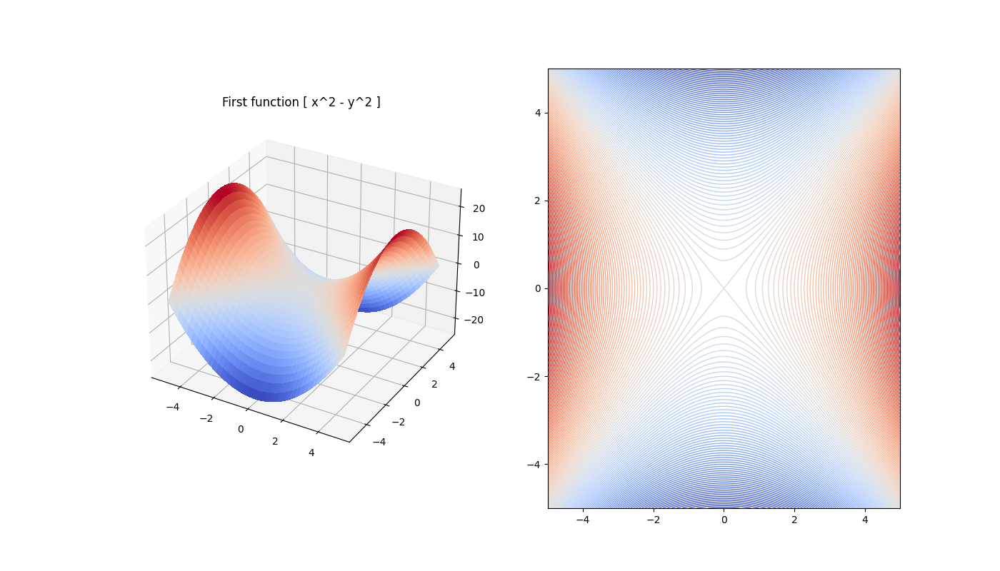

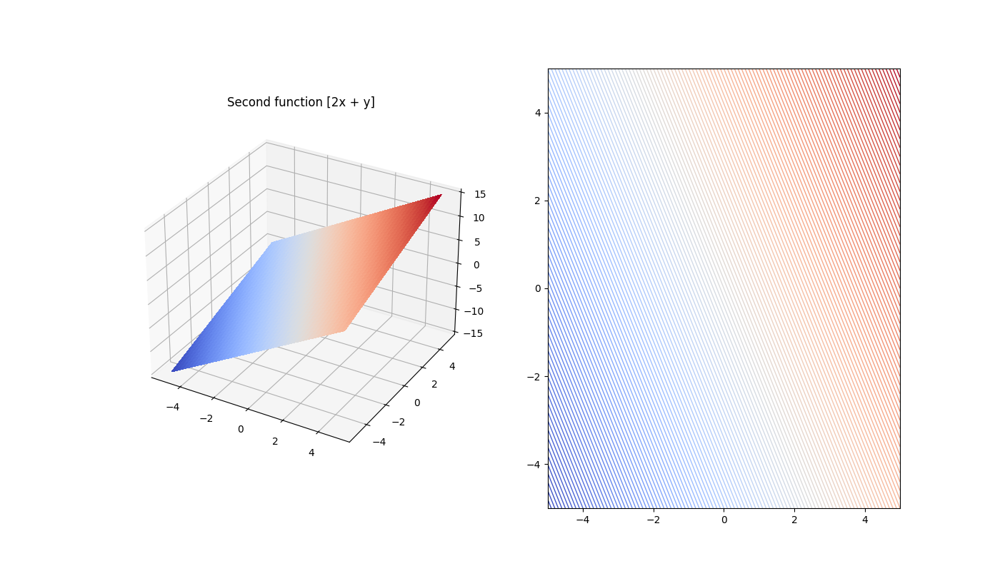

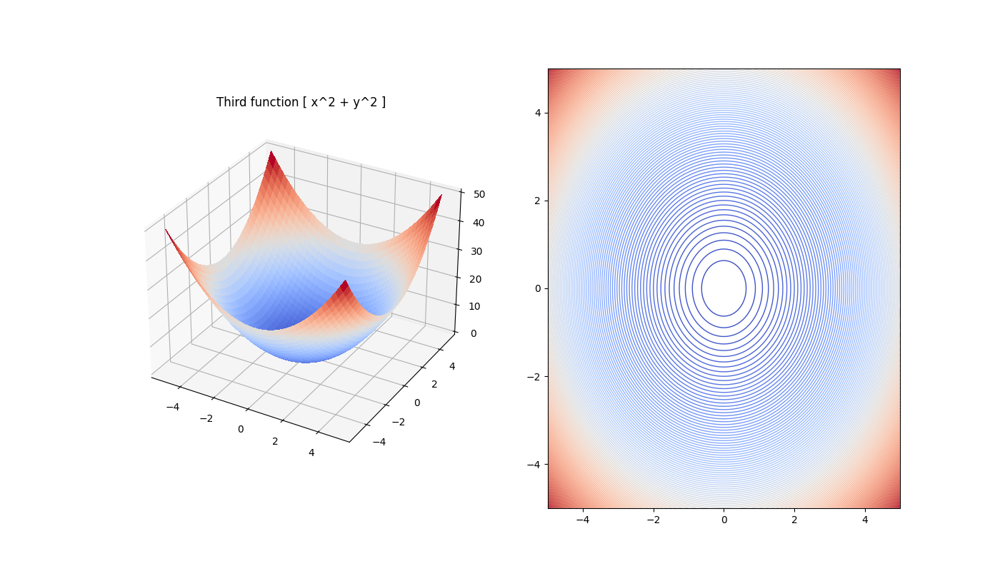

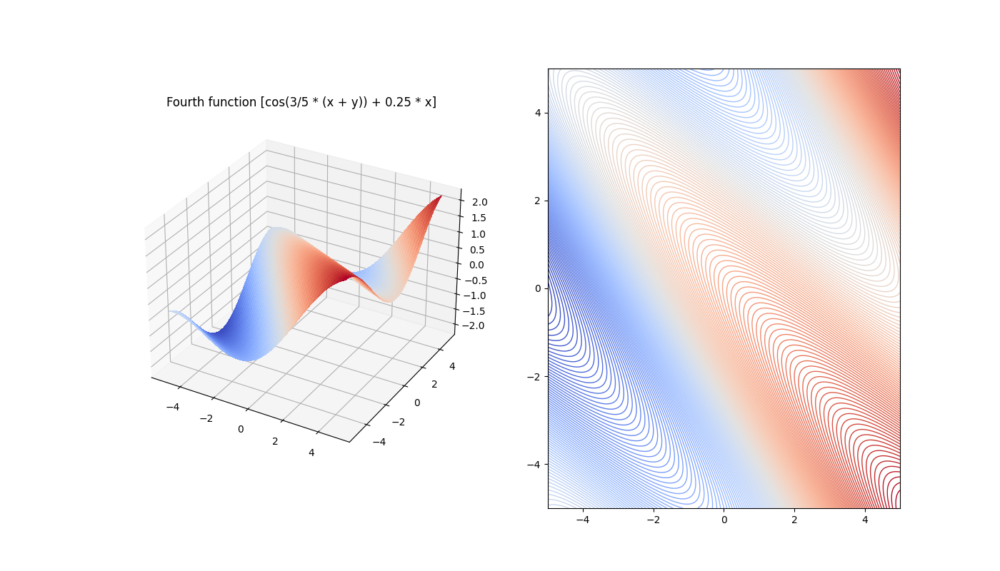

In [15]:
#%matplotlib inline
toy_saddle_points()

#### **2. Complete the function toy_primal_dual. Follow the comments provided in the code.**

In [16]:
def toy_primal_dual(A, b, lambda_, x, pd_prms, fig = None, ax1 = None, ax2 = None, ax3 = None, ax4 = None):
    """
    toy_primal_dual - minimizes a non-differentiable function f:R^n-:param R of the
    form 

       f(x) = ||Ax|| + 1/(2*lambda)*|| x - b ||^2. 

    using a form of duality to remove the non-differentiability. It transforms
    the problem into a max-min problem, solved numerically with a gradient
    descent and gradient ascent.

    [x,y] = toy_primal_dual (A, b, lambda, x, pd_prms) 

    :param A       : mxn matrix (n is the dimension of x)
    :param b       : nx1 vector
    :param lambda  : weight between two terms
    :param x       : nx1 initial condition for primal variable
    :param pd_prms : a structure with the dual maximization parameters. Needs to have
                     the following fields:
                     
                        :param delta     : dual gradient ascent step size
                        :param theta     : primal gradient descent step size
                        :param max_iters : maximum number of iterations
                        :param tolerance : tolerance for the stopping condition (it stop when 
                                           the norm of the gradient is below the tolerance)

    :return x     : primal value found (nx1)
    :return y     : dual   value found (mx1)
    :return fps   : evolution of the primal function (total_iters x 1 vector)
    :return fds   : evolution of the dual function (total_iters x 1 vector)
    """
    # Get all the params
    tolerance = pd_prms.get("tolerance")
    max_iters = pd_prms.get("max_iters")
    delta     = pd_prms.get("delta")
    theta     = pd_prms.get("theta")
    
    # initialize dual to 0
    y = 0 * x

    # vectors with function values
    fps = []
    fds = []

    # begin projected gradient ascent
    it = 0
    dual_gap = np.inf
    while (dual_gap > tolerance) and (it < max_iters):
        # Increment the iteration
        it = it + 1
        
        # Save the current value, just for displaying
        x_old = x
        y_old = y

        # TODO: update x by gradient descent with step theta
        x = x_old - theta * (np.dot(A.T,y_old)+(1/lambda_)*(x_old-b))
        # TODO: update y by gradient ascent with step delta
        y_to_project= y_old + delta * np.dot(A,x)
        # TODO: project y over constraint set
        y = y_to_project/max(1, np.linalg.norm(y_to_project))
        # compute primal energy
        P_data = (1 / 2 / lambda_) * np.power(x - b, 2).sum()
        P = np.linalg.norm(np.dot(A, x)) + P_data

        # compute dual energy
        Aty = np.dot(A.T, y)
        D = np.dot(b.T, Aty) - lambda_ / 2 * np.power(Aty, 2).sum()

        # compute primal dual energy
        PD = np.dot(np.dot(A, x).T, y) + P_data
        # TODO: update dual gap
        dual_gap = P-D

        # Update the arrays
        fps.append(P)
        fds.append(D)
        
        # Update the plot
        if fig is not None:
            # ---- 
            if x.shape[0] == 2 and x.shape[1] == 1:
                ax1.plot([x_old[0, 0], x[0, 0]], 
                         [x_old[1, 0], x[1, 0]], "-k")
                ax2.plot([y_old[0, 0], y[0, 0]], 
                         [y_old[1, 0], y[1, 0]], "-k")
                ax3.scatter(x[0, 0], x[1, 0], P, marker = "o", color = "k")
                ax4.scatter(y[0, 0], y[1, 0], D, marker = "o", color = "k")
                
            elif x.shape[0] == 1 and x.shape[1] == 1:
                ax1.plot(x, P, marker = '.', color = "k")
                ax2.plot(y, D, marker = '.', color = "k")
                ax3.plot([x_old[0, 0], x[0, 0]], 
                         [y_old[0, 0], y[0, 0]], "-k")
                ax4.scatter(x, y, PD, marker = "o", color = "k")
                
            else:
                pass
            # ----
            display.clear_output(wait=True)
            display.display(fig) 
        
        # Print the current values
        print('[It. {0} of {1}] |P( x(k) ) - D( y(k) )| = {2}'.format(it, max_iters,dual_gap))

    return fps, fds

#### **3. Complete the function toy_dual. Follow the comments provided in the code.**

In [17]:
def toy_dual(A, b, lambda_, d_prms, fig = None, ax1 = None, ax2 = None, ax3 = None, ax4 = None):
    """
    toy_dual - minimizes a non-differentiable function f:R^n-:param R of the form 

       f(x) = ||Ax|| + 1/2/lambda*|| x - b ||^2. 

    using a form of duality to remove the non-differentiability. It transforms
    the problem into a max-min problem, eliminates the primal by solving the min
    analytically, and solves the max numerically with a gradient ascent.

    [x,xi] = toy_dual (A, b, lambda, d_prms) 

    :param A      : mxn matrix (n is the dimension of x)
    :param b      : nx1 vector
    :param lambda : weight between two terms
    :param d_prms : a structure with the dual maximization parameters. Needs to have
                    the following fields:
                   :param delta     : gradient ascent step size
                   :param max_iters : maximum number of iterations
                   :param tolerance : tolerance for the stopping condition (it stop when 
                                      the norm of the gradient is below the tolerance)

    :return x     : primal value found (nx1)
    :return xi    : dual   value found (mx1)
    :return fps   : evolution of the primal function (total_iters x 1 vector)
    :return fds   : evolution of the dual function (total_iters x 1 vector)
    """
    # Get all the params
    tolerance = d_prms.get("tolerance")
    max_iters = d_prms.get("max_iters")
    delta     = d_prms.get("delta")
    
    # Initialization
    y = np.zeros((len(A), 1))
    
    # TODO: Initialize x
    x = b-lambda_*np.dot(A.T,y)

    # vectors with function values
    fps = []
    fds = []

    # begin projected gradient ascent
    it = 0
    dual_gap = np.inf
    while (dual_gap > tolerance) and (it < max_iters):
        # Increment the iteration
        it = it + 1
        
        # Save the current value, just for displaying
        y_old = y
        x_old = x

        # TODO: update y by gradient ascent with step delta
        y_to_project = y + delta *  np.dot(A,x)
        # project y over constraint set
        y = y_to_project/max(1,np.linalg.norm(y_to_project))
        # TODO: compute primal variable as x^*(xi)
        x = b-lambda_*np.dot(A.T,y)
    
        # compute primal energy
        P_data = (1 / 2 / lambda_) * np.power(x - b, 2).sum()
        P = np.linalg.norm(np.dot(A, x)) + P_data

        # compute dual energy
        Aty = np.dot(A.T, y)
        D = np.dot(b.T, Aty) - lambda_ / 2 * np.power(Aty, 2).sum()

        # compute primal dual energy
        PD = np.dot(np.dot(A, x).T, y) + P_data

        # TODO: update dual gap
        dual_gap = P-D

        # Update the arrays
        fps.append(P)
        fds.append(D)
        
        # Update the plot
        if fig is not None:
            # ---- 
            if x.shape[0] == 2 and x.shape[1] == 1:
                ax1.plot([x_old[0, 0], x[0, 0]], 
                         [x_old[1, 0], x[1, 0]], "-k")
                ax2.plot([y_old[0, 0], y[0, 0]], 
                         [y_old[1, 0], y[1, 0]], "-k")
                ax3.scatter(x[0, 0], x[1, 0], P, marker = "o", color = "k")
                ax4.scatter(y[0, 0], y[1, 0], D, marker = "o", color = "k")
                
            elif x.shape[0] == 1 and x.shape[1] == 1:
                ax1.plot(x, P, marker = '.', color = "k")
                ax2.plot(y, D, marker = '.', color = "k")
                ax3.plot([x_old[0, 0], x[0, 0]], 
                         [y_old[0, 0], y[0, 0]], "-k")
                ax4.scatter(x, y, PD, marker = "o", color = "k")
                
            else:
                pass
            # ----
            display.clear_output(wait=True)
            display.display(fig)  
        
        # Print the current values
        print('[It. {0} of {1}] |P( x(k) ) - D( y(k) )| = {2}'.format(it, max_iters,dual_gap))

    return fps, fds

#### **4. Run the functions toy_problem_R1 and toy_problem_R2. Explain the plots that are displayed in each case. Try different parameters as suggested in the comments in the code.**

In [18]:
def toy_problem_r1():
    # vector x to plot primal function
    x = np.matrix(np.arange(start = -10, stop = 5.01, step = .01))
    pmg_sz = len(x)

    # vector y to plot dual function
    y = np.matrix(np.arange(start = -1.1, stop = 1.1, step = .01))
    dmg_sz = len(y)

    # parameters of primal function
    A = np.identity(n = 1)
    b = np.matrix([-6])
    lambda_ = 3  # TRY also lambda_ = 10

    # compute primal function on x
    Ax = A * x
    E1 = np.sqrt(np.power(Ax, 2))
    E2 = np.power(x - np.tile(b, [1, pmg_sz]), 2)
    E  = E1 + (1 / (2 * lambda_)) * E2

    # compute dual function on y
    Aty = A.T * y
    D = np.dot(b.T, Aty) - lambda_ / 2 * np.power(Aty, 2)
    D = np.where(np.power(y, 2) > 1, np.nan, D)

    # compute primal-dual function on a primal-dual grid
    X, Y = np.meshgrid(x,y) # this is a primal-dual grid
    pdmg_sz = len(X)

    PD = np.tile(E2, [dmg_sz, 1]) / (2 * lambda_) + y.T * Ax
    PD = np.where(np.power(Y, 2) > 1, np.nan, PD)

    # ------- #
    # PLOT 
    # ------- #
    # Make the plots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize = (14, 8))
    ax4 = fig.add_subplot(2, 2, 4, projection='3d')
    ax1.plot(np.array(x)[0], np.array(E)[0])
    ax2.plot(np.array(y)[0], np.array(D)[0])
    ax3.contour(X, Y, PD, 
            corner_mask = False, levels = 150, 
            linewidths=(1,), cmap = cm.coolwarm)
    ax4.plot_surface(X, Y, PD, cmap=cm.coolwarm,
                     linewidth=0, antialiased=False, 
                     vmax=1)
    ax1.set_title("Primal")
    ax2.set_title("Dual")
    ax3.set_title("Primal Dual")
    ax4.set_title("Primal Dual")
    
    # primal dual ----------------------------------------------
    x0 = np.matrix([3])
    pd_prms = {"delta": 0.01,
               "theta": 0.3,
               "max_iters": 1000,
               "tolerance": 1e-8}
    fps, fds = toy_primal_dual(A, b, lambda_, x0, pd_prms, fig, ax1, ax2, ax3, ax4)

    # dual ----------------------------------------------
    input("Press Enter to continue...")
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize = (14, 8))
    ax4 = fig.add_subplot(2, 2, 4, projection='3d')
    ax1.plot(np.array(x)[0], np.array(E)[0])
    ax2.plot(np.array(y)[0], np.array(D)[0])
    ax3.contour(X, Y, PD, 
            corner_mask = False, levels = 150, 
            linewidths=(1,), cmap = cm.coolwarm)
    ax4.plot_surface(X, Y, PD, cmap=cm.coolwarm,
                     linewidth=0, antialiased=False, 
                     vmax=1)
    ax1.set_title("Primal")
    ax2.set_title("Dual")
    ax3.set_title("Primal Dual")
    ax4.set_title("Primal Dual")
    d_prms = {"delta": 0.01,
              "max_iters": 1000,
              "tolerance": 1e-8}
    fps, fds = toy_dual(A, b, lambda_, d_prms, fig, ax1, ax2, ax3, ax4)

KeyboardInterrupt: 

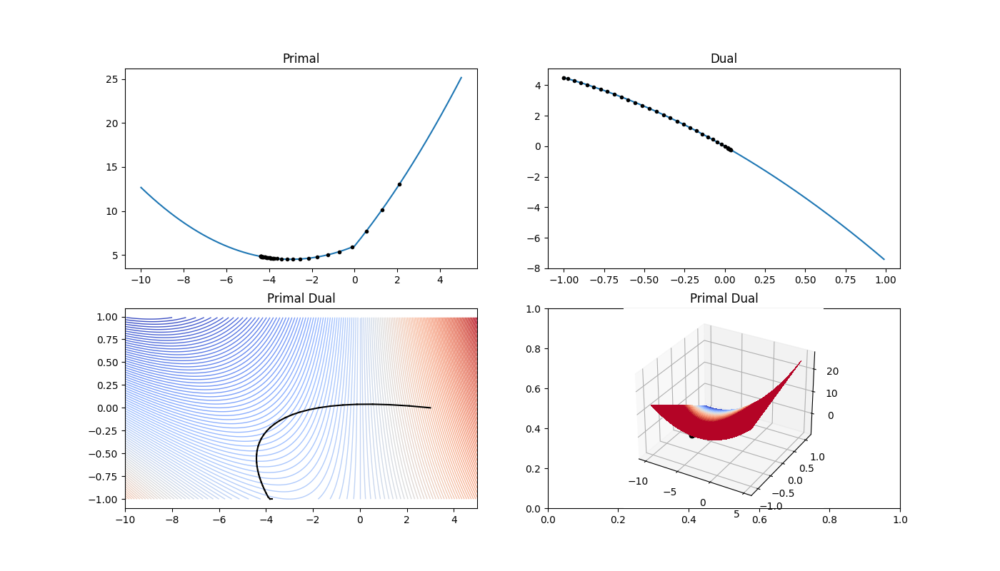

In [19]:
toy_problem_r1()

In [49]:
def toy_problem_r2():
    # primal mesh to draw primal function
    xx1 = np.matrix(np.arange(start = -15, stop = 10.1, step = .1))
    xx2 = np.matrix(np.arange(start = -10, stop = 15.1, step = .1))
    [x1, x2] = np.meshgrid(xx1, xx2)
    x = np.vstack((x1.T.flatten(), x2.T.flatten()))
    pmg_sz = x1.shape

    # dual mesh to draw dual function
    xy1 = np.matrix(np.arange(start = -1.1, stop = 1.1, step = .01))
    xy2 = np.matrix(np.arange(start = -1.1, stop = 1.1, step = .01))
    [y1, y2] = np.meshgrid(xy1, xy2)
    y = np.vstack((y1.T.flatten(), y2.T.flatten()))
    dmg_sz = y1.shape


    # parameters of primal function
    A = np.matrix([[1, -.5], [-.5, 1]])
    b = np.matrix([[-10], [3]])
    lambda_ = 4

    # compute primal function on primal grid
    Ax = np.dot(A, x)
    E1 = np.sqrt(np.power(Ax, 2).sum(axis = 0))
    E2 = np.power(x - np.tile(b, [1, np.prod(pmg_sz)]), 2).sum(axis = 0)
    E  = np.reshape(E1, pmg_sz).T + (1 / (2 * lambda_)) * np.reshape(E2, pmg_sz).T

    # compute dual function on dual grid
    Aty = np.dot(A.T, y)
    D = np.reshape(np.dot(b.T, Aty) - lambda_ / 2 * np.power(Aty,  2).sum(axis = 0), dmg_sz).T
    D = np.where((np.power(y, 2).sum(axis = 0) > 1).reshape(dmg_sz), np.nan, D)

    # ------- #
    # PLOT 
    # ------- #
    # Make the plots
    
    # NOTE: in this case x and y are two dimensional variables. 
    #       Therefore, G(x,y) is a function of 4 variables and we
    #       cannot plot it. We only plot the primal and the dual 
    #       functions.
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize = (14, 8))
    ax3 = fig.add_subplot(2, 2, 3, projection='3d')
    ax4 = fig.add_subplot(2, 2, 4, projection='3d')
    ax1.contour(x1, x2, E, 
            corner_mask = False, levels = 150, 
            linewidths=(1,), cmap = cm.coolwarm)    
    ax2.contour(y1, y2, D, 
                corner_mask = False, levels = 150, 
                linewidths=(1,), cmap = cm.coolwarm)
    ax3.plot_surface(x1, x2, E, cmap=cm.coolwarm,
                     linewidth=0, antialiased=False)
#                     vmax=1)
    ax4.plot_surface(y1, y2, D, cmap=cm.coolwarm,
                     linewidth=0, antialiased=False) 
                     #vmax=1)
    ax1.set_title("Primal function")
    ax2.set_title("Dual function")
    ax3.set_title("Primal function")
    ax4.set_title("Dual function")
    
    # primal dual ----------------------------------------------
    pd_prms = {"tolerance": 1e-4,
               "delta": 1e-1,
               "theta": 1e-0,
               "max_iters": 1000}
    x_star, y_star = toy_primal_dual(A, b, lambda_, np.matrix([[5], [-5]]), pd_prms, fig, ax1, ax2, ax3, ax4)
    
    # dual ----------------------------------------------
    input("Press Enter to continue...")
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize = (14, 8))
    ax3 = fig.add_subplot(2, 2, 3, projection='3d')
    ax4 = fig.add_subplot(2, 2, 4, projection='3d')
    ax1.contour(x1, x2, E, 
            corner_mask = False, levels = 150, 
            linewidths=(1,), cmap = cm.coolwarm)    
    ax2.contour(y1, y2, D, 
                corner_mask = False, levels = 150, 
                linewidths=(1,), cmap = cm.coolwarm)
    ax3.plot_surface(x1, x2, E, cmap=cm.coolwarm,
                     linewidth=0, antialiased=False) 
      #               vmax=1)
    ax4.plot_surface(y1, y2, D, cmap=cm.coolwarm,
                     linewidth=0, antialiased=False)
      #               vmax=1)
    ax1.set_title("Primal function")
    ax2.set_title("Dual function")
    ax3.set_title("Primal function")
    ax4.set_title("Dual function")
    d_prms = {"tolerance": 1e-4,
               "delta": 1e-1,
               "max_iters": 1000}
    x_star, y_star = toy_dual(A, b, lambda_, d_prms, fig, ax1, ax2, ax3, ax4)

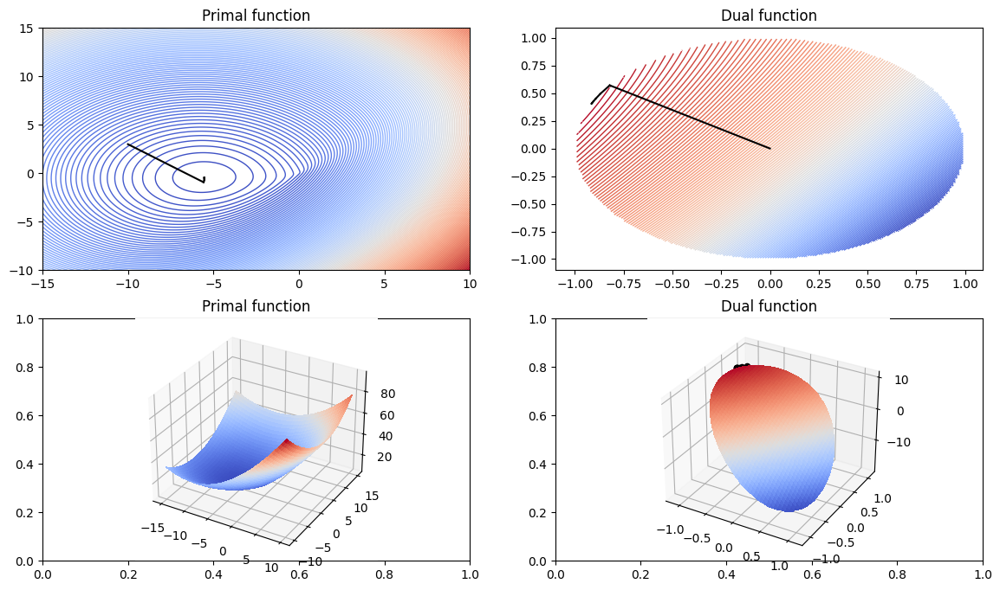

[It. 7 of 1000] |P( x(k) ) - D( y(k) )| = [[6.73831504e-05]]


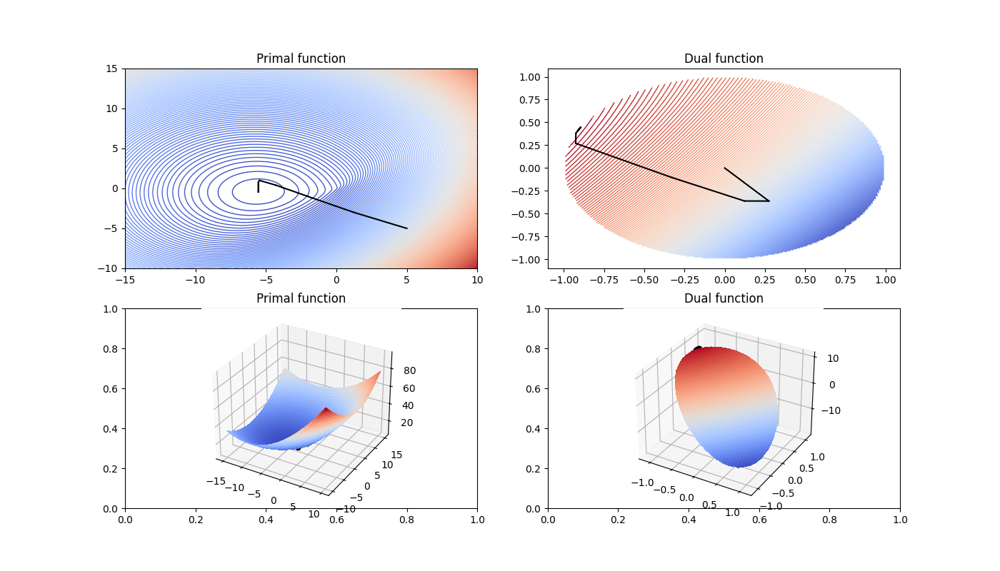

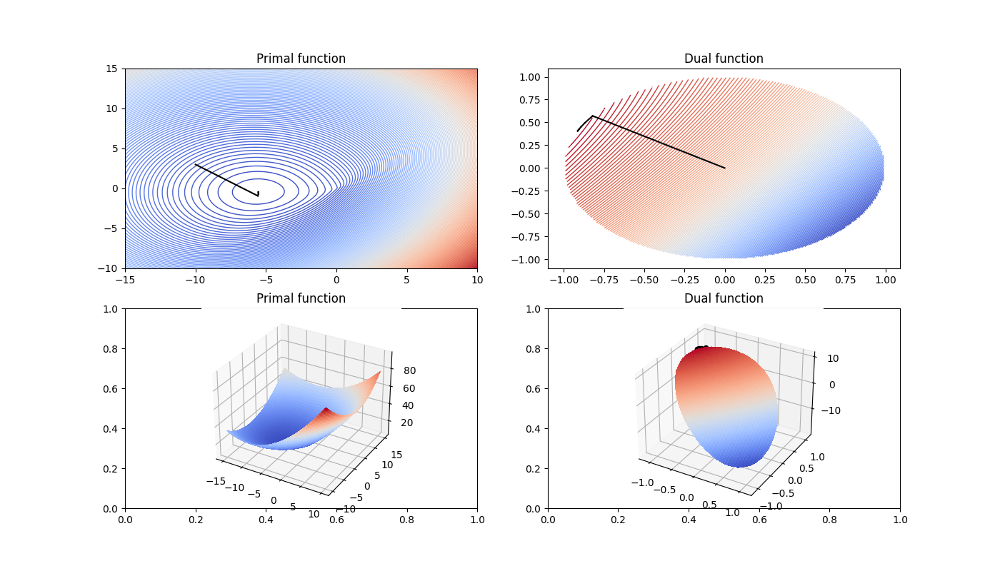

In [50]:
toy_problem_r2()